## Project 4: Advance Lane Finding

In [1]:
# 1
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

### Step 1: Compute Camera Calibration Matrix and Distortion Coefficents given a set of chessboard images.

In [2]:
# 2
from Undistorter import Undistorter
undistorter = Undistorter()

### Test Step 1 on Chessboard Images

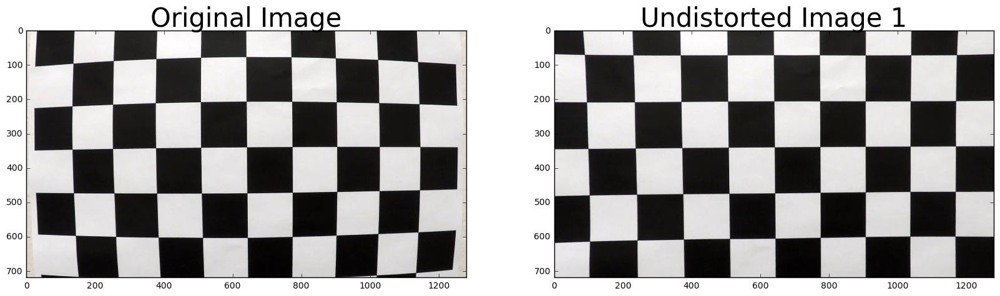

In [3]:
# 3
# img = cv2.imread('../test_images/chessboard/test_image.jpg')
img = mpimg.imread('../camera_cal/calibration1.jpg', cv2.IMREAD_UNCHANGED)
img_dist = undistorter.undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(img_dist)
ax2.set_title('Undistorted Image 1', fontsize=30)
plt.show()

### Test Step 1 on Straight Line Test Images

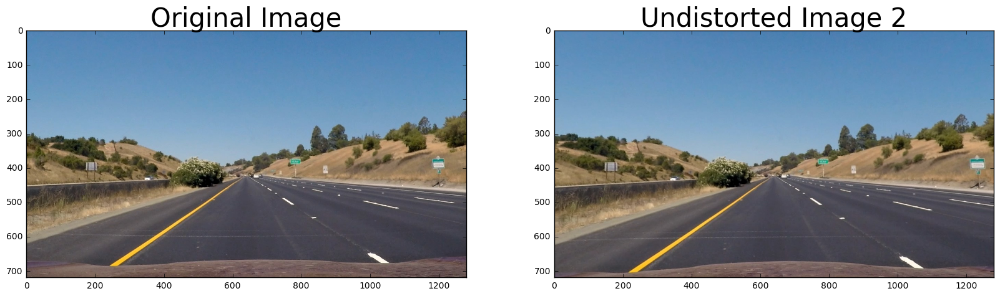

In [4]:
# 4
img = mpimg.imread('../test_images/straight_lines1.jpg', cv2.IMREAD_UNCHANGED)
img_dist = undistorter.undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(img_dist)
ax2.set_title('Undistorted Image 2', fontsize=30)
plt.show()

# mpimg.imsave('../output_images/undistorted_straight_lines2.jpg', img_dist)

`straight_lines2.jpg` is the best example of showing the undistortion of the original image. In the original image, notice that the car on the left is located roughly at 100 on the x-axis. Undistorting the image moves the car location to near 0 on the x-axis.

<hr />

### Step 2: Apply a distortion correction to raw images

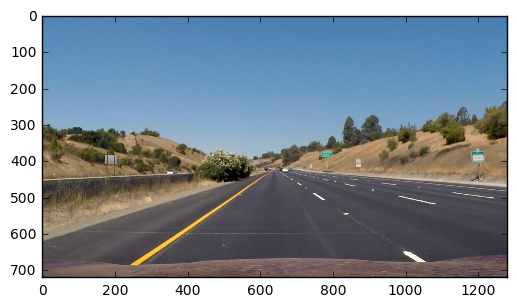

In [5]:
# 5
from GradientThresholder import GradientThresholder
thresholder = GradientThresholder()

img = mpimg.imread('../test_images/straight_lines1.jpg', cv2.IMREAD_UNCHANGED)
plt.imshow(img)
plt.show()

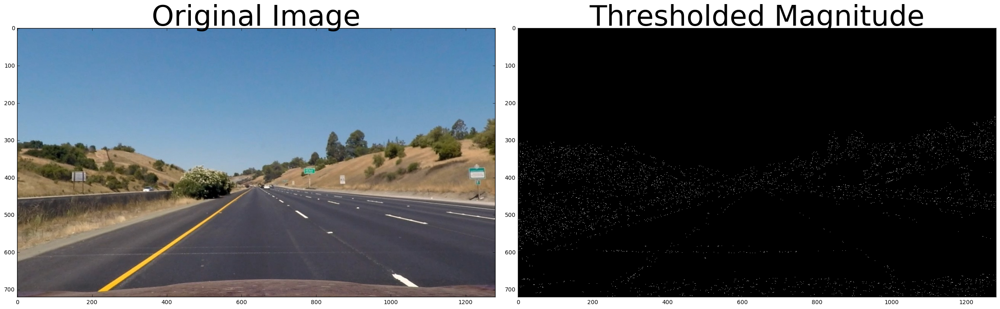

In [6]:
# 6
sobelx, sobely = thresholder.sobel_x_y(img)
mag_binary = thresholder.magnitude_threshold(sobelx, sobely)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_dist)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

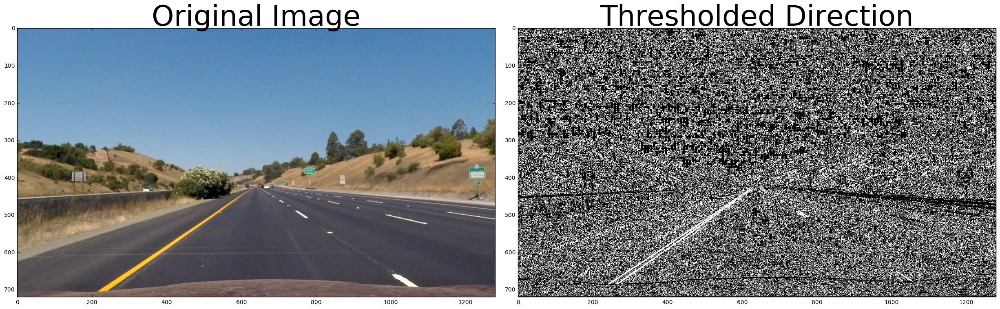

In [7]:
# 7
dir_binary = thresholder.direction_threshold(sobelx, sobely)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_dist)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

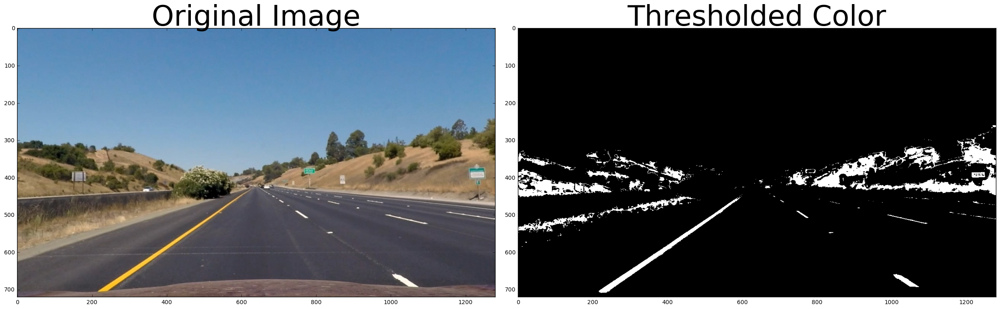

In [8]:
# 8
color_binary = thresholder.hsv_color_threshold(img_dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_dist)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(color_binary, cmap='gray')
ax2.set_title('Thresholded Color', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

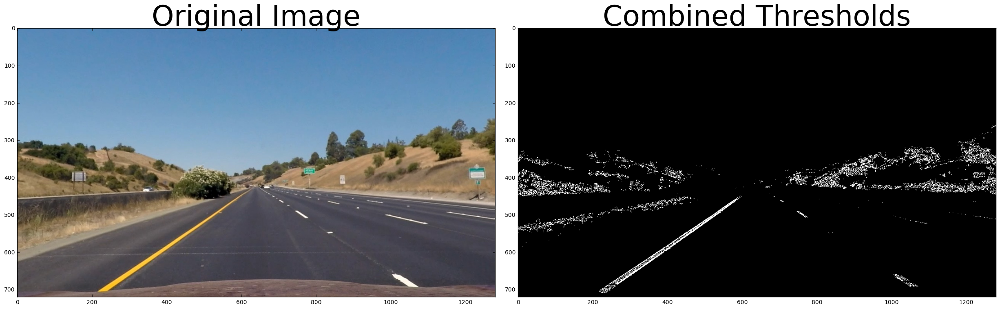

In [9]:
# 9
combined_img = np.zeros_like(mag_binary)
combined_img[((color_binary == 1) & ((mag_binary ==1) | (dir_binary== 1)))] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_dist)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined_img, cmap='gray')
ax2.set_title('Combined Thresholds', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

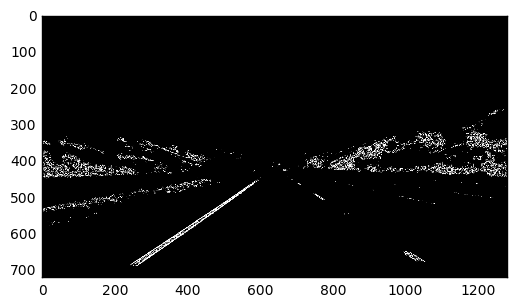

In [10]:
# 10 - This method `combined_threshold` combinees cells 5-9.
thresh_img = thresholder.combined_threshold(img)
plt.imshow(thresh_img, cmap="gray")
plt.show()

mpimg.imsave('../output_images/thresholded_straight_lines1-single.jpg', thresh_img)

<hr />

### Step 3: Apply a perspective transform to rectify binary image ("birds-eye view").

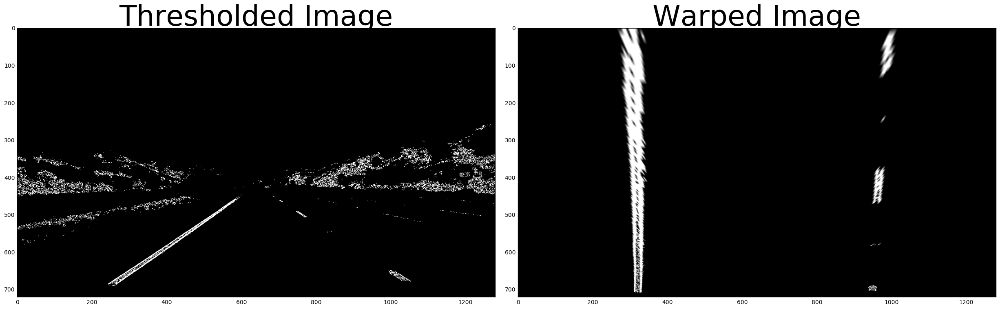

In [11]:
# 11
from PerspectiveTransform import PerspectiveTransform
perspectiveTransform = PerspectiveTransform()
warped_img = perspectiveTransform.warp(thresh_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(thresh_img, cmap="gray")
ax1.set_title('Thresholded Image', fontsize=50)
ax2.imshow(warped_img, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

mpimg.imsave('../output_images/warped_straight_lines1-single.jpg', warped_img)

In [12]:
# gray = cv2.cvtColor(warped_img, cv2.COLOR_RGB2GRAY)
# plt.imshow(warped_img, cmap="gray")
# plt.show()

# mpimg.imsave('../output_images/warped_straight_lines1-single2.jpg', gray_image)

<hr />

### Step 4: Detect lane pixels and fit to find the lane boundary.

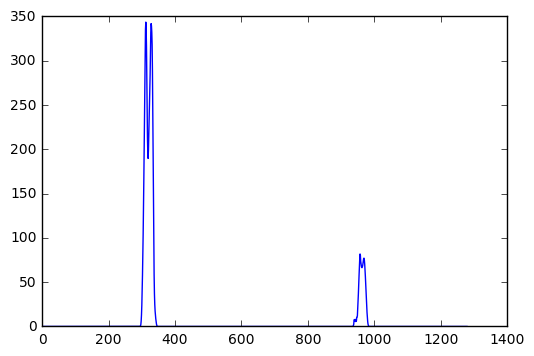

In [13]:
from FindingLaneLines import FindingLaneLines
lanelines = FindingLaneLines()
histogram = lanelines.histogram(warped_img)
plt.plot(histogram)
plt.show()

In [14]:
peaks = lanelines.find_peaks(histogram)
print('Peaks: ', peaks)

Peaks:  (640, 312, 957)


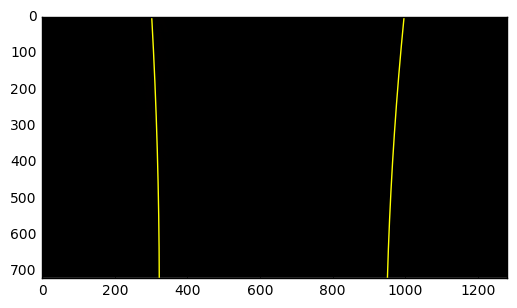

In [15]:
out_img = lanelines.out_img(warped_img)
nonzero, nonzeroy, nonzerox = lanelines.nonzeros(warped_img)
left_lane_inds, right_lane_inds, left_fit, right_fit = lanelines.detect_lane_lines(warped_img)

# Generate x and y values for plotting
ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()

In [16]:
# leftx, rightx, left_fitx, right_fitx = lanelines.measure_curvature(warped_img)
left_curverad, right_curverad = lanelines.get_curvature(warped_img)

# Plot up the fake data
# mark_size = 3
# plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
# plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
# plt.xlim(0, 1280)
# plt.ylim(0, 720)
# plt.plot(left_fitx, ploty, color='green', linewidth=3)
# plt.plot(right_fitx, ploty, color='green', linewidth=3)
# plt.gca().invert_yaxis() # to visualize as we do the images
# plt.show()

4476.98467403 m 3390.13563939 m


<hr />

### Step 5: Describe how (and identify where in your code) you calculated the radius of curvature of the lane and position of the vehicle in respect to center.

In [17]:
from LaneDrawer import LaneDrawer
lanedrawer = LaneDrawer()

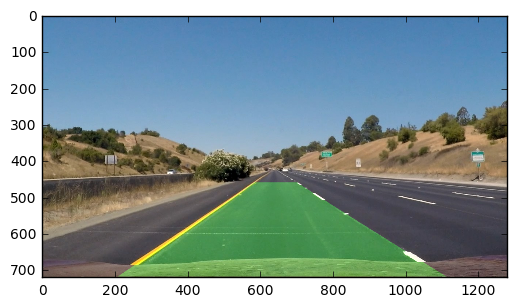

In [18]:
final_img = lanedrawer.plotPolygon(img, left_fit, right_fit, perspectiveTransform.Minv)
plt.imshow(final_img)
plt.show()

mpimg.imsave('../output_images/final_straight_lines1-single.jpg', final_img)

### Step 6: Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

In [19]:
from LaneTracker import LaneTracker
lanetracker = LaneTracker()

5815.32683274 m 6973.70952284 m


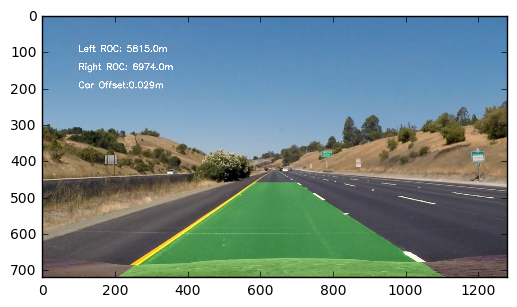

In [20]:
proc_img = lanetracker.process(img)
plt.imshow(proc_img)
mpimg.imsave('../output_images/final-measurements_straight_line1-single.png', proc_img)
plt.show()

In [ ]:
from moviepy.editor import VideoFileClip
def process_movie(input_path, output_path):
    clip = VideoFileClip(input_path)
    out_clip = clip.fl_image(lanetracker.process) #.subclip(0,5)
    out_clip.write_videofile(output_path, audio=False)

In [ ]:
process_movie("../project_video.mp4", "../project_video_out.mp4")

701.469831138 m 2046.00053358 m
[MoviePy] >>>> Building video ../project_video_out.mp4
[MoviePy] Writing video ../project_video_out.mp4


  0%|          | 1/1261 [00:00<06:32,  3.21it/s]

701.469831138 m 2046.00053358 m


  0%|          | 2/1261 [00:00<06:23,  3.29it/s]

670.130166373 m 2019.46740375 m


  0%|          | 3/1261 [00:00<06:05,  3.44it/s]

636.048093506 m 2106.70233746 m


  0%|          | 4/1261 [00:01<05:58,  3.50it/s]

953.680630179 m 655.329561033 m


  0%|          | 5/1261 [00:01<05:43,  3.65it/s]

955.231721987 m 725.272502491 m


  0%|          | 6/1261 [00:01<05:56,  3.52it/s]

815.847338232 m 798.181410212 m


  1%|          | 7/1261 [00:01<06:02,  3.46it/s]

536.218139595 m 893.713682387 m


  1%|          | 8/1261 [00:02<05:46,  3.62it/s]

721.617662242 m 55712.3694672 m


  1%|          | 9/1261 [00:02<05:39,  3.69it/s]

683.730662032 m 5984.43400825 m


  1%|          | 10/1261 [00:02<05:32,  3.77it/s]

674.45668412 m 7707.1058488 m


  1%|          | 11/1261 [00:03<05:34,  3.74it/s]

695.190447116 m 27420.1551877 m


  1%|          | 12/1261 [00:03<05:30,  3.78it/s]

731.862920796 m 3444.44386337 m


  1%|          | 13/1261 [00:03<05:24,  3.84it/s]

773.911394901 m 4287.70838932 m


  1%|          | 14/1261 [00:03<05:21,  3.88it/s]

734.978932719 m 9739.42725028 m


  1%|          | 15/1261 [00:04<05:25,  3.83it/s]

1117.72692961 m 2954.02612008 m


  1%|▏         | 16/1261 [00:04<05:21,  3.87it/s]

1178.80386898 m 861.571485924 m


  1%|▏         | 17/1261 [00:04<05:18,  3.90it/s]

1422.30797384 m 1000.10665602 m


  1%|▏         | 18/1261 [00:04<05:21,  3.87it/s]

1469.75496835 m 1014.22907082 m


  2%|▏         | 19/1261 [00:05<05:17,  3.91it/s]

1265.04671904 m 1271.24122495 m


  2%|▏         | 20/1261 [00:05<05:17,  3.91it/s]

1124.73051915 m 1197.44248005 m


  2%|▏         | 21/1261 [00:05<05:14,  3.95it/s]

871.747871065 m 7595.63904109 m


  2%|▏         | 22/1261 [00:05<05:12,  3.96it/s]

1270.86456247 m 5061.2197171 m


  2%|▏         | 23/1261 [00:06<05:23,  3.82it/s]

1032.65315658 m 2336.45431415 m


  2%|▏         | 24/1261 [00:06<05:21,  3.85it/s]

846.695067924 m 4251.74278854 m


  2%|▏         | 25/1261 [00:06<05:34,  3.69it/s]

966.859883007 m 2301.17863548 m


  2%|▏         | 26/1261 [00:07<06:06,  3.37it/s]

820.680232995 m 16389.2613003 m


  2%|▏         | 27/1261 [00:07<05:54,  3.48it/s]

738.27622883 m 895.778892802 m


  2%|▏         | 28/1261 [00:07<05:36,  3.67it/s]

765.654481456 m 1574.3822989 m


  2%|▏         | 29/1261 [00:07<05:42,  3.59it/s]

891.254619065 m 965.303840968 m


  2%|▏         | 30/1261 [00:08<05:36,  3.65it/s]

832.542515637 m 640.409755046 m


  2%|▏         | 31/1261 [00:08<05:29,  3.73it/s]

791.638929681 m 760.557278577 m


  3%|▎         | 32/1261 [00:08<05:15,  3.89it/s]

826.42110667 m 784.238036655 m


  3%|▎         | 33/1261 [00:08<05:10,  3.95it/s]

755.451014049 m 1244.23446904 m


  3%|▎         | 34/1261 [00:09<05:08,  3.98it/s]

611.604035853 m 5567.6358577 m


  3%|▎         | 35/1261 [00:09<05:11,  3.94it/s]

754.559005779 m 3620.27953499 m


  3%|▎         | 36/1261 [00:09<05:10,  3.94it/s]

654.930437248 m 8346.17631879 m


  3%|▎         | 37/1261 [00:09<05:19,  3.83it/s]

620.341347603 m 1184.76848032 m


  3%|▎         | 38/1261 [00:10<05:17,  3.85it/s]

551.91707109 m 1555.6221504 m


  3%|▎         | 39/1261 [00:10<05:12,  3.91it/s]

510.079090574 m 1283.54726919 m


  3%|▎         | 40/1261 [00:10<05:15,  3.87it/s]

516.721395505 m 1057.13961892 m


  3%|▎         | 41/1261 [00:10<05:38,  3.60it/s]

600.100368841 m 629.687985162 m


  3%|▎         | 42/1261 [00:11<05:35,  3.63it/s]

586.935514416 m 682.022995536 m


  3%|▎         | 43/1261 [00:11<06:28,  3.13it/s]

622.351362476 m 686.386211677 m


  3%|▎         | 44/1261 [00:12<07:43,  2.63it/s]

709.582758568 m 685.766807749 m


  4%|▎         | 45/1261 [00:12<07:24,  2.73it/s]

726.694316139 m 689.204946068 m


  4%|▎         | 46/1261 [00:12<07:05,  2.85it/s]

595.560311393 m 2309.81436651 m


  4%|▎         | 47/1261 [00:13<07:16,  2.78it/s]

629.446611839 m 1892.89368367 m


  4%|▍         | 48/1261 [00:13<07:13,  2.80it/s]

601.87050407 m 1393.01143353 m


  4%|▍         | 49/1261 [00:13<07:42,  2.62it/s]

679.03238117 m 2471.39725316 m


  4%|▍         | 50/1261 [00:14<07:26,  2.71it/s]

580.522567178 m 1366.15761974 m


  4%|▍         | 51/1261 [00:14<07:46,  2.59it/s]

557.286485967 m 1926.53851119 m


  4%|▍         | 52/1261 [00:15<07:26,  2.71it/s]

842.489355541 m 958.595732065 m


  4%|▍         | 53/1261 [00:15<06:57,  2.89it/s]

914.927344779 m 1191.67047133 m


  4%|▍         | 54/1261 [00:15<06:27,  3.12it/s]

878.503631135 m 579.708532554 m


  4%|▍         | 55/1261 [00:15<06:11,  3.25it/s]

1064.80756794 m 673.063589737 m


  4%|▍         | 56/1261 [00:16<06:04,  3.31it/s]

1210.71771226 m 721.271697606 m


  5%|▍         | 57/1261 [00:16<05:56,  3.38it/s]

943.600701687 m 733.554991175 m


  5%|▍         | 58/1261 [00:16<05:49,  3.44it/s]

1146.16896977 m 1035.95325563 m


  5%|▍         | 59/1261 [00:17<05:44,  3.49it/s]

1133.25591121 m 10479.9703633 m


  5%|▍         | 60/1261 [00:17<05:46,  3.47it/s]

1065.37532111 m 2506.18611848 m


  5%|▍         | 61/1261 [00:17<05:50,  3.43it/s]

950.539544327 m 2547.81958855 m


  5%|▍         | 62/1261 [00:17<05:38,  3.54it/s]

797.366241875 m 1426.66786159 m


  5%|▍         | 63/1261 [00:18<05:34,  3.58it/s]

1054.90573965 m 2304.91477126 m


  5%|▌         | 64/1261 [00:18<05:46,  3.45it/s]

1121.51334235 m 854.174411097 m


  5%|▌         | 65/1261 [00:18<05:50,  3.42it/s]

796.818787887 m 794.032276861 m


  5%|▌         | 66/1261 [00:19<05:39,  3.52it/s]

762.475440907 m 912.448025606 m


  5%|▌         | 67/1261 [00:19<05:28,  3.63it/s]

672.580325816 m 1016.99157703 m


  5%|▌         | 68/1261 [00:19<05:32,  3.58it/s]

750.554419033 m 1120.52764115 m


  5%|▌         | 69/1261 [00:19<05:35,  3.55it/s]

743.830140724 m 1081.6096669 m


  6%|▌         | 70/1261 [00:20<05:33,  3.58it/s]

864.152392985 m 1243.61085122 m


  6%|▌         | 71/1261 [00:20<05:35,  3.55it/s]

880.988559814 m 3622.80107846 m


  6%|▌         | 72/1261 [00:20<05:33,  3.57it/s]

953.637909821 m 4071.62127333 m


  6%|▌         | 73/1261 [00:20<05:28,  3.62it/s]

1024.28361206 m 11589.8406323 m


  6%|▌         | 74/1261 [00:21<05:33,  3.56it/s]

1118.07469535 m 4167.60192201 m


  6%|▌         | 75/1261 [00:21<05:33,  3.55it/s]

1011.60412194 m 2262.58037261 m


  6%|▌         | 76/1261 [00:21<05:33,  3.56it/s]

1221.79397466 m 4242.93057581 m


  6%|▌         | 77/1261 [00:22<05:32,  3.56it/s]

1516.38846143 m 1924.82648579 m


  6%|▌         | 78/1261 [00:22<05:37,  3.51it/s]

2116.22848986 m 1952.36604015 m


  6%|▋         | 79/1261 [00:22<05:24,  3.64it/s]

1609.36545401 m 632.703257934 m


  6%|▋         | 80/1261 [00:22<05:21,  3.67it/s]

1504.03767371 m 625.109388126 m


  6%|▋         | 81/1261 [00:23<05:15,  3.74it/s]

1459.75402626 m 698.17828225 m


  7%|▋         | 82/1261 [00:23<05:11,  3.79it/s]

1629.093203 m 756.909104751 m


  7%|▋         | 83/1261 [00:23<05:19,  3.69it/s]

1579.69568775 m 998.657665421 m


  7%|▋         | 84/1261 [00:23<05:16,  3.72it/s]

1340.58369536 m 8808.14503334 m


  7%|▋         | 85/1261 [00:24<05:10,  3.79it/s]

1242.57569462 m 12801.812419 m


  7%|▋         | 86/1261 [00:24<05:03,  3.87it/s]

932.304718978 m 3069.52023582 m


  7%|▋         | 87/1261 [00:24<04:59,  3.92it/s]

857.106211505 m 6040.92976659 m


  7%|▋         | 88/1261 [00:24<05:01,  3.89it/s]

663.861652736 m 7055.50570454 m


  7%|▋         | 89/1261 [00:25<04:55,  3.97it/s]

640.430461467 m 4136.42621014 m


  7%|▋         | 90/1261 [00:25<04:49,  4.05it/s]

671.178815945 m 646.158095603 m


  7%|▋         | 91/1261 [00:25<04:48,  4.05it/s]

711.997473886 m 827.156949 m


  7%|▋         | 92/1261 [00:25<04:51,  4.01it/s]

843.301480288 m 835.18677172 m


  7%|▋         | 93/1261 [00:26<04:47,  4.07it/s]

747.134381294 m 905.439164868 m


  7%|▋         | 94/1261 [00:26<04:55,  3.95it/s]

638.10437684 m 949.299799842 m


  8%|▊         | 95/1261 [00:26<04:49,  4.03it/s]

594.961014148 m 1073.25138991 m


  8%|▊         | 96/1261 [00:26<04:46,  4.06it/s]

589.216102951 m 2360.13741474 m


  8%|▊         | 97/1261 [00:27<04:40,  4.14it/s]

578.369546205 m 1584.71857665 m


  8%|▊         | 98/1261 [00:27<04:35,  4.22it/s]

714.418179142 m 2291.42103629 m


  8%|▊         | 99/1261 [00:27<04:41,  4.12it/s]

696.185844202 m 1823.03610578 m


  8%|▊         | 100/1261 [00:27<04:47,  4.04it/s]

532.091079417 m 910.137269262 m


  8%|▊         | 101/1261 [00:28<04:46,  4.04it/s]

641.438264262 m 1674.97203598 m


  8%|▊         | 102/1261 [00:28<04:46,  4.05it/s]

902.049191827 m 992.108136423 m


  8%|▊         | 103/1261 [00:28<04:46,  4.05it/s]

928.010993861 m 883.250728462 m


  8%|▊         | 104/1261 [00:28<04:43,  4.08it/s]

850.824378342 m 626.627727469 m


  8%|▊         | 105/1261 [00:29<04:38,  4.15it/s]

812.519755607 m 718.138184449 m


  8%|▊         | 106/1261 [00:29<04:38,  4.14it/s]

955.438434535 m 765.511122611 m


  8%|▊         | 107/1261 [00:29<04:47,  4.01it/s]

937.024045324 m 821.215241351 m


  9%|▊         | 108/1261 [00:29<04:47,  4.00it/s]

888.353400503 m 867.618576874 m


  9%|▊         | 109/1261 [00:30<04:44,  4.04it/s]

1228.57485667 m 3039.22030006 m


  9%|▊         | 110/1261 [00:30<04:38,  4.13it/s]

696.098513624 m 9425.78928002 m


  9%|▉         | 111/1261 [00:30<04:35,  4.17it/s]

552.738473278 m 1875.43148906 m


  9%|▉         | 112/1261 [00:30<04:33,  4.20it/s]

679.629787643 m 1490.18068836 m


  9%|▉         | 113/1261 [00:31<04:37,  4.14it/s]

559.429615617 m 2561.6679276 m


  9%|▉         | 114/1261 [00:31<04:51,  3.94it/s]

603.930030071 m 7749.33288416 m


  9%|▉         | 115/1261 [00:31<04:57,  3.86it/s]

841.700574036 m 1761.04208223 m


  9%|▉         | 116/1261 [00:31<04:54,  3.89it/s]

766.957016811 m 471.535071935 m


  9%|▉         | 117/1261 [00:32<04:51,  3.92it/s]

847.374878053 m 585.053805445 m


  9%|▉         | 118/1261 [00:32<04:43,  4.03it/s]

749.913443717 m 611.543537744 m


  9%|▉         | 119/1261 [00:32<04:37,  4.12it/s]

678.645101222 m 605.579980056 m


 10%|▉         | 120/1261 [00:32<04:37,  4.11it/s]

634.353140097 m 630.622243471 m


 10%|▉         | 121/1261 [00:33<04:31,  4.20it/s]

643.534891406 m 746.435897763 m


 10%|▉         | 122/1261 [00:33<04:26,  4.27it/s]

673.565463768 m 1122.22101614 m


 10%|▉         | 123/1261 [00:33<04:32,  4.18it/s]

636.269256083 m 1207.91767867 m


 10%|▉         | 124/1261 [00:33<04:33,  4.16it/s]

563.32576804 m 1139.059104 m


 10%|▉         | 125/1261 [00:34<04:31,  4.18it/s]

724.759074151 m 791.516184209 m


 10%|▉         | 126/1261 [00:34<04:32,  4.17it/s]

772.000379311 m 1375.95614525 m


 10%|█         | 127/1261 [00:34<04:32,  4.16it/s]

885.941339317 m 1111.79803322 m


 10%|█         | 128/1261 [00:34<04:31,  4.18it/s]

797.633061346 m 793.697490136 m


 10%|█         | 129/1261 [00:34<04:25,  4.26it/s]

712.437903445 m 594.121995062 m


 10%|█         | 130/1261 [00:35<04:22,  4.30it/s]

971.927700036 m 632.796248502 m


 10%|█         | 131/1261 [00:35<04:24,  4.28it/s]

613.507114244 m 680.764030873 m


 10%|█         | 132/1261 [00:35<04:24,  4.28it/s]

610.801540113 m 673.739255131 m


 11%|█         | 133/1261 [00:35<04:27,  4.22it/s]

595.895488161 m 706.483562241 m


 11%|█         | 134/1261 [00:36<04:47,  3.93it/s]

611.74291312 m 1095.14936281 m


 11%|█         | 135/1261 [00:36<04:59,  3.75it/s]

676.037453286 m 1721.57145697 m


 11%|█         | 136/1261 [00:36<04:50,  3.88it/s]

659.339077529 m 1083.12974239 m


 11%|█         | 137/1261 [00:36<04:45,  3.94it/s]

520.557957741 m 2409.62820371 m


 11%|█         | 138/1261 [00:37<04:41,  3.99it/s]

716.826792741 m 2498.53913381 m


 11%|█         | 139/1261 [00:37<04:37,  4.05it/s]

957.212704864 m 1259.69612263 m


 11%|█         | 140/1261 [00:37<04:35,  4.07it/s]

969.769029568 m 521218.858195 m


 11%|█         | 141/1261 [00:37<04:30,  4.14it/s]

1161.565151 m 2183.64814692 m


 11%|█▏        | 142/1261 [00:38<04:28,  4.16it/s]

950.671689451 m 843.313831784 m


 11%|█▏        | 143/1261 [00:38<04:30,  4.14it/s]

869.122467922 m 901.510044807 m


 11%|█▏        | 144/1261 [00:38<04:25,  4.20it/s]

690.050968867 m 898.168373298 m


 11%|█▏        | 145/1261 [00:38<04:23,  4.23it/s]

753.156418072 m 1015.40105552 m


 12%|█▏        | 146/1261 [00:39<04:24,  4.22it/s]

872.629914915 m 993.00707621 m


 12%|█▏        | 147/1261 [00:39<04:23,  4.23it/s]

687.491679157 m 8408.41536528 m


 12%|█▏        | 148/1261 [00:39<04:20,  4.28it/s]

745.068420133 m 3201.27203089 m


 12%|█▏        | 149/1261 [00:39<04:19,  4.29it/s]

757.912508166 m 2032.8713246 m


 12%|█▏        | 150/1261 [00:40<04:16,  4.33it/s]

1072.24804239 m 2584.68909115 m


 12%|█▏        | 151/1261 [00:40<04:21,  4.24it/s]

981.529849692 m 1945.71387515 m


 12%|█▏        | 152/1261 [00:40<04:21,  4.24it/s]

1175.95831176 m 1942.04857974 m


 12%|█▏        | 153/1261 [00:40<04:20,  4.26it/s]

1162.87956479 m 632.003893873 m


 12%|█▏        | 154/1261 [00:40<04:17,  4.30it/s]

1256.3656803 m 672.397238985 m


 12%|█▏        | 155/1261 [00:41<04:20,  4.25it/s]

1275.72683519 m 718.283593338 m


 12%|█▏        | 156/1261 [00:41<04:18,  4.27it/s]

902.891019664 m 752.320470766 m


 12%|█▏        | 157/1261 [00:41<04:19,  4.25it/s]

942.515675276 m 811.502966833 m


 13%|█▎        | 158/1261 [00:41<04:20,  4.23it/s]

865.7578706 m 786.716681647 m


 13%|█▎        | 159/1261 [00:42<04:24,  4.17it/s]

813.794354601 m 3397.30048796 m


 13%|█▎        | 160/1261 [00:42<04:24,  4.16it/s]

763.768313627 m 37497.720879 m


 13%|█▎        | 161/1261 [00:42<04:26,  4.13it/s]

689.803745637 m 4343.15216862 m


 13%|█▎        | 162/1261 [00:42<04:23,  4.17it/s]

652.54929552 m 4683.20136309 m


 13%|█▎        | 163/1261 [00:43<04:24,  4.15it/s]

745.265390646 m 2711.80415197 m


 13%|█▎        | 164/1261 [00:43<04:20,  4.21it/s]

787.537956231 m 7930.34661852 m


 13%|█▎        | 165/1261 [00:43<04:22,  4.18it/s]

854.456173994 m 8555.80162993 m


 13%|█▎        | 166/1261 [00:43<04:21,  4.19it/s]

903.581077922 m 831.7413345 m


 13%|█▎        | 167/1261 [00:44<04:20,  4.19it/s]

731.806709883 m 788.70906962 m


 13%|█▎        | 168/1261 [00:44<04:22,  4.16it/s]

750.255292829 m 842.57848277 m


 13%|█▎        | 169/1261 [00:44<04:25,  4.11it/s]

732.489867288 m 864.865002268 m


 13%|█▎        | 170/1261 [00:44<04:22,  4.15it/s]

788.34786349 m 893.685656401 m


 14%|█▎        | 171/1261 [00:45<04:26,  4.09it/s]

844.323744419 m 994.404620109 m


 14%|█▎        | 172/1261 [00:45<04:29,  4.03it/s]

891.861321476 m 838.566767553 m


 14%|█▎        | 173/1261 [00:45<04:24,  4.12it/s]

863.894941175 m 1079.85940811 m


 14%|█▍        | 174/1261 [00:45<04:19,  4.18it/s]

824.117760836 m 1264.51090807 m


 14%|█▍        | 175/1261 [00:46<04:18,  4.20it/s]

903.498420383 m 755.386027824 m


 14%|█▍        | 176/1261 [00:46<04:15,  4.24it/s]

1021.31297546 m 344.742674617 m


 14%|█▍        | 177/1261 [00:46<04:45,  3.80it/s]

942.393666257 m 564.112318915 m


 14%|█▍        | 178/1261 [00:46<04:31,  3.99it/s]

1307.94419766 m 419.921402204 m


 14%|█▍        | 179/1261 [00:47<04:25,  4.08it/s]

1175.07557858 m 443.480365685 m


 14%|█▍        | 180/1261 [00:47<04:22,  4.12it/s]

1130.66880959 m 459.502380676 m


 14%|█▍        | 181/1261 [00:47<04:21,  4.13it/s]

873.929194448 m 432.434396711 m


 14%|█▍        | 182/1261 [00:47<04:18,  4.17it/s]

758.477092033 m 454.775309652 m


 15%|█▍        | 183/1261 [00:47<04:17,  4.18it/s]

667.271353366 m 473.143132942 m


 15%|█▍        | 184/1261 [00:48<04:14,  4.24it/s]

610.936175546 m 961.5887956 m


 15%|█▍        | 185/1261 [00:48<04:15,  4.21it/s]

540.36273106 m 937.919892245 m


 15%|█▍        | 186/1261 [00:48<04:17,  4.18it/s]

482.129346764 m 562.405478871 m


 15%|█▍        | 187/1261 [00:48<04:20,  4.13it/s]

563.796307927 m 563.291682657 m


 15%|█▍        | 188/1261 [00:49<04:20,  4.13it/s]

649.228992273 m 627.554058053 m


 15%|█▍        | 189/1261 [00:49<04:18,  4.14it/s]

548.402489126 m 692.685049209 m


 15%|█▌        | 190/1261 [00:49<04:16,  4.18it/s]

574.082288889 m 573.169904883 m


 15%|█▌        | 191/1261 [00:49<04:18,  4.14it/s]

598.604761291 m 607.556516646 m


 15%|█▌        | 192/1261 [00:50<04:14,  4.20it/s]

611.526285685 m 615.105360626 m


 15%|█▌        | 193/1261 [00:50<04:12,  4.22it/s]

552.514026055 m 620.662881571 m


 15%|█▌        | 194/1261 [00:50<04:09,  4.27it/s]

557.824752328 m 589.528479402 m


 15%|█▌        | 195/1261 [00:50<04:10,  4.25it/s]

461.229604321 m 640.269098786 m


 16%|█▌        | 196/1261 [00:51<04:10,  4.26it/s]

547.540515829 m 1096.68677199 m


 16%|█▌        | 197/1261 [00:51<04:06,  4.31it/s]

621.905190991 m 1855.89433141 m


 16%|█▌        | 198/1261 [00:51<04:06,  4.31it/s]

622.683322817 m 1740.99377827 m


 16%|█▌        | 199/1261 [00:51<04:09,  4.26it/s]

724.425496096 m 1671.84084775 m


 16%|█▌        | 200/1261 [00:51<04:06,  4.31it/s]

736.188803379 m 2348.03613235 m


 16%|█▌        | 201/1261 [00:52<04:05,  4.33it/s]

727.310218378 m 1190.58698712 m


 16%|█▌        | 202/1261 [00:52<04:05,  4.32it/s]

674.289463448 m 2905.89744679 m


 16%|█▌        | 203/1261 [00:52<04:07,  4.27it/s]

877.301554752 m 1348.3415984 m


 16%|█▌        | 204/1261 [00:52<04:06,  4.29it/s]

947.329604105 m 975.708704407 m


 16%|█▋        | 205/1261 [00:53<04:04,  4.32it/s]

771.626405132 m 674.858939289 m


 16%|█▋        | 206/1261 [00:53<04:03,  4.33it/s]

787.884530666 m 675.244861242 m


 16%|█▋        | 207/1261 [00:53<04:08,  4.24it/s]

756.300812253 m 641.357717808 m


 16%|█▋        | 208/1261 [00:53<04:11,  4.18it/s]

672.943165358 m 1227.30814969 m


 17%|█▋        | 209/1261 [00:54<04:15,  4.12it/s]

675.01712495 m 1498.08079477 m


 17%|█▋        | 210/1261 [00:54<04:11,  4.17it/s]

654.846002678 m 1386.4645701 m


 17%|█▋        | 211/1261 [00:54<04:14,  4.12it/s]

811.972185048 m 1619.2125377 m


 17%|█▋        | 212/1261 [00:54<04:15,  4.10it/s]

634.366113885 m 1219.33564309 m


 17%|█▋        | 213/1261 [00:55<04:16,  4.09it/s]

652.743559594 m 1275.19748962 m


 17%|█▋        | 214/1261 [00:55<04:12,  4.15it/s]

683.227776148 m 727.032548998 m


 17%|█▋        | 215/1261 [00:55<04:09,  4.20it/s]

874.203341813 m 1064.83362795 m


 17%|█▋        | 216/1261 [00:55<04:05,  4.26it/s]

910.973264856 m 702.932691955 m


 17%|█▋        | 217/1261 [00:56<04:07,  4.22it/s]

656.029396721 m 793.47192231 m


 17%|█▋        | 218/1261 [00:56<04:05,  4.25it/s]

755.473856605 m 851.513347269 m


 17%|█▋        | 219/1261 [00:56<04:09,  4.18it/s]

623.015982846 m 917.11180275 m


 17%|█▋        | 220/1261 [00:56<04:10,  4.16it/s]

697.34584462 m 1184.00633608 m


 18%|█▊        | 221/1261 [00:57<04:12,  4.12it/s]

689.440668601 m 2188.6512055 m


 18%|█▊        | 222/1261 [00:57<04:09,  4.16it/s]

580.431156773 m 3253.90804459 m


 18%|█▊        | 223/1261 [00:57<04:10,  4.14it/s]

689.752028391 m 271477.986338 m


 18%|█▊        | 224/1261 [00:57<04:06,  4.20it/s]

652.31079266 m 19964.7510881 m


 18%|█▊        | 225/1261 [00:57<04:04,  4.24it/s]

708.72739277 m 2079.37781245 m


 18%|█▊        | 226/1261 [00:58<04:03,  4.24it/s]

1008.55478085 m 3650.32215895 m


 18%|█▊        | 227/1261 [00:58<04:08,  4.17it/s]

893.167275383 m 6228.5752927 m


 18%|█▊        | 228/1261 [00:58<04:05,  4.21it/s]

937.170904021 m 802.850921447 m


 18%|█▊        | 229/1261 [00:58<04:02,  4.26it/s]

781.367941921 m 807.134771011 m


 18%|█▊        | 230/1261 [00:59<04:02,  4.24it/s]

789.850911684 m 886.600840128 m


 18%|█▊        | 231/1261 [00:59<04:05,  4.20it/s]

774.157903528 m 861.09200987 m


 18%|█▊        | 232/1261 [00:59<04:03,  4.22it/s]

881.332670219 m 1030.77043837 m


 18%|█▊        | 233/1261 [00:59<04:04,  4.20it/s]

1014.71231194 m 1196.13073673 m


 19%|█▊        | 234/1261 [01:00<04:02,  4.24it/s]

860.195555551 m 2600.69307314 m


 19%|█▊        | 235/1261 [01:00<04:03,  4.22it/s]

980.204721852 m 2413.87985168 m


 19%|█▊        | 236/1261 [01:00<04:04,  4.19it/s]

1036.95573914 m 1497.21883833 m


 19%|█▉        | 237/1261 [01:00<04:00,  4.26it/s]

1065.23294353 m 851.873314535 m


 19%|█▉        | 238/1261 [01:01<03:58,  4.29it/s]

1042.61446771 m 934.571337504 m


 19%|█▉        | 239/1261 [01:01<04:01,  4.23it/s]

1050.77113518 m 593.759977201 m


 19%|█▉        | 240/1261 [01:01<03:59,  4.26it/s]

980.601417986 m 558.553363627 m


 19%|█▉        | 241/1261 [01:01<04:00,  4.24it/s]

737.630891245 m 599.676480956 m


 19%|█▉        | 242/1261 [01:01<03:58,  4.27it/s]

725.531230702 m 636.994064812 m


 19%|█▉        | 243/1261 [01:02<04:00,  4.23it/s]

671.837870408 m 589.844242446 m


 19%|█▉        | 244/1261 [01:02<04:00,  4.23it/s]

696.51586546 m 615.944360218 m


 19%|█▉        | 245/1261 [01:02<03:59,  4.24it/s]

692.211245949 m 912.539709994 m


 20%|█▉        | 246/1261 [01:02<04:06,  4.12it/s]

634.076934141 m 955.401034371 m


 20%|█▉        | 247/1261 [01:03<04:09,  4.06it/s]

682.251301199 m 1043.32607983 m


 20%|█▉        | 248/1261 [01:03<04:07,  4.09it/s]

741.052407371 m 1193.06367033 m


 20%|█▉        | 249/1261 [01:03<04:05,  4.12it/s]

756.096014043 m 747.82129597 m


 20%|█▉        | 250/1261 [01:03<04:02,  4.18it/s]

674.55166256 m 554.842853752 m


 20%|█▉        | 251/1261 [01:04<04:00,  4.20it/s]

715.042452842 m 589.969480067 m


 20%|█▉        | 252/1261 [01:04<03:57,  4.25it/s]

684.643713093 m 688.079338647 m


 20%|██        | 253/1261 [01:04<03:56,  4.26it/s]

727.389965119 m 732.817484477 m


 20%|██        | 254/1261 [01:04<03:56,  4.25it/s]

747.28562133 m 734.918225547 m


 20%|██        | 255/1261 [01:05<03:59,  4.20it/s]

730.605319703 m 743.874794865 m


 20%|██        | 256/1261 [01:05<03:59,  4.20it/s]

735.286690633 m 774.935093321 m


 20%|██        | 257/1261 [01:05<03:57,  4.23it/s]

714.54914216 m 1817.73219965 m


 20%|██        | 258/1261 [01:05<03:56,  4.24it/s]

779.840328543 m 1224.31922087 m


 21%|██        | 259/1261 [01:06<03:58,  4.21it/s]

786.498818258 m 1882.02934308 m


 21%|██        | 260/1261 [01:06<03:56,  4.24it/s]

931.712512886 m 1456.72283501 m


 21%|██        | 261/1261 [01:06<03:53,  4.27it/s]

913.035168666 m 941.201980701 m


 21%|██        | 262/1261 [01:06<03:53,  4.29it/s]

911.797066699 m 1367.76744712 m


 21%|██        | 263/1261 [01:06<03:58,  4.19it/s]

859.484448647 m 559.368633378 m


 21%|██        | 264/1261 [01:07<04:05,  4.06it/s]

908.905081865 m 629.468650021 m


 21%|██        | 265/1261 [01:07<04:05,  4.06it/s]

860.539519436 m 636.136862539 m


 21%|██        | 266/1261 [01:07<04:04,  4.08it/s]

896.081316464 m 674.635928402 m


 21%|██        | 267/1261 [01:07<04:05,  4.05it/s]

731.781674732 m 733.047503137 m


 21%|██▏       | 268/1261 [01:08<04:03,  4.09it/s]

763.079807518 m 781.442282633 m


 21%|██▏       | 269/1261 [01:08<04:03,  4.07it/s]

786.520028246 m 861.341521913 m


 21%|██▏       | 270/1261 [01:08<04:00,  4.11it/s]

942.628605905 m 6120.74751055 m


 21%|██▏       | 271/1261 [01:08<04:02,  4.08it/s]

841.374197971 m 2650.75258126 m


 22%|██▏       | 272/1261 [01:09<03:58,  4.14it/s]

838.648089464 m 2112.27529387 m


 22%|██▏       | 273/1261 [01:09<03:58,  4.15it/s]

907.781440368 m 2112.0363628 m


 22%|██▏       | 274/1261 [01:09<03:59,  4.13it/s]

847.638434069 m 642.424759552 m


 22%|██▏       | 275/1261 [01:09<04:10,  3.93it/s]

891.660004416 m 666.166282044 m


 22%|██▏       | 276/1261 [01:10<04:08,  3.97it/s]

908.633749272 m 795.323366363 m


 22%|██▏       | 277/1261 [01:10<04:01,  4.07it/s]

876.88470674 m 860.741943477 m


 22%|██▏       | 278/1261 [01:10<03:59,  4.11it/s]

940.436139461 m 855.272024098 m


 22%|██▏       | 279/1261 [01:10<04:02,  4.05it/s]

998.844749263 m 948.03623125 m


 22%|██▏       | 280/1261 [01:11<03:59,  4.09it/s]

1145.36257673 m 993.919466871 m


 22%|██▏       | 281/1261 [01:11<03:56,  4.15it/s]

1252.76123501 m 7198.82581554 m


 22%|██▏       | 282/1261 [01:11<03:53,  4.19it/s]

1060.33893354 m 11817.4307737 m


 22%|██▏       | 283/1261 [01:11<03:57,  4.12it/s]

1177.57322558 m 12988.6404333 m


 23%|██▎       | 284/1261 [01:12<04:00,  4.07it/s]

1122.65838327 m 4244.73636083 m


 23%|██▎       | 285/1261 [01:12<03:56,  4.13it/s]

1214.81492072 m 4749.71801772 m


 23%|██▎       | 286/1261 [01:12<03:53,  4.17it/s]

1327.8645969 m 8462.65792542 m


 23%|██▎       | 287/1261 [01:12<03:55,  4.14it/s]

1484.53851115 m 58632.6410934 m


 23%|██▎       | 288/1261 [01:13<03:53,  4.16it/s]

1499.72452155 m 7058.59454803 m


 23%|██▎       | 289/1261 [01:13<03:52,  4.18it/s]

1191.6951649 m 1118.79804842 m


 23%|██▎       | 290/1261 [01:13<03:50,  4.21it/s]

1291.11543575 m 1117.27590254 m


 23%|██▎       | 291/1261 [01:13<03:53,  4.15it/s]

1268.21433189 m 1244.51958721 m


 23%|██▎       | 292/1261 [01:14<03:54,  4.14it/s]

1307.96954171 m 1302.9420926 m


 23%|██▎       | 293/1261 [01:14<03:57,  4.07it/s]

1270.85718878 m 2244.38587881 m


 23%|██▎       | 294/1261 [01:14<03:55,  4.10it/s]

1231.71586808 m 7449.61701436 m


 23%|██▎       | 295/1261 [01:14<03:53,  4.14it/s]

1227.92710178 m 4691.21399003 m


 23%|██▎       | 296/1261 [01:15<03:50,  4.18it/s]

1397.58148008 m 9194.26295497 m


 24%|██▎       | 297/1261 [01:15<03:46,  4.25it/s]

1478.10196474 m 3205.44344382 m


 24%|██▎       | 298/1261 [01:15<03:46,  4.25it/s]

1584.57025315 m 5484.30532276 m


 24%|██▎       | 299/1261 [01:15<03:44,  4.28it/s]

1942.37519039 m 738.719375954 m


 24%|██▍       | 300/1261 [01:15<03:43,  4.29it/s]

2475.82649963 m 930.726413366 m


 24%|██▍       | 301/1261 [01:16<03:49,  4.19it/s]

1467.98605398 m 1119.45555941 m


 24%|██▍       | 302/1261 [01:16<03:53,  4.10it/s]

1595.24588073 m 1147.20794978 m


 24%|██▍       | 303/1261 [01:16<03:55,  4.07it/s]

1863.77481886 m 1305.10049238 m


 24%|██▍       | 304/1261 [01:16<03:54,  4.08it/s]

1723.65962183 m 1812.2056333 m


 24%|██▍       | 305/1261 [01:17<03:53,  4.10it/s]

2322.71026972 m 1799.50373166 m


 24%|██▍       | 306/1261 [01:17<03:54,  4.07it/s]

2359.65579873 m 2814.08316813 m


 24%|██▍       | 307/1261 [01:17<03:51,  4.12it/s]

2638.82420311 m 1786.92556991 m


 24%|██▍       | 308/1261 [01:17<03:47,  4.19it/s]

3728.275534 m 1774.04347518 m


 25%|██▍       | 309/1261 [01:18<03:46,  4.21it/s]

5552.99324579 m 2481.75590892 m


 25%|██▍       | 310/1261 [01:18<03:50,  4.13it/s]

4970.61736272 m 875.021296519 m


 25%|██▍       | 311/1261 [01:18<03:47,  4.18it/s]

4013.89680315 m 11428.1498258 m


 25%|██▍       | 312/1261 [01:18<03:47,  4.17it/s]

13257.4137007 m 3612.29947914 m


 25%|██▍       | 313/1261 [01:19<03:45,  4.21it/s]

10673.658531 m 8766.6720842 m


 25%|██▍       | 314/1261 [01:19<03:47,  4.16it/s]

33598.4119843 m 30583.8232073 m


 25%|██▍       | 315/1261 [01:19<03:46,  4.17it/s]

8999.88728327 m 27889.0632644 m


 25%|██▌       | 316/1261 [01:19<03:44,  4.21it/s]

23090.4888413 m 14566.5534538 m


 25%|██▌       | 317/1261 [01:20<03:42,  4.24it/s]

176073.948713 m 3068.86740412 m


 25%|██▌       | 318/1261 [01:20<03:45,  4.18it/s]

8001.12254068 m 1394.25850895 m


 25%|██▌       | 319/1261 [01:20<03:48,  4.12it/s]

7917.24948142 m 2595.71571377 m


 25%|██▌       | 320/1261 [01:20<03:51,  4.06it/s]

11685.8327086 m 2045.80772104 m


 25%|██▌       | 321/1261 [01:21<03:51,  4.06it/s]

12615.4871399 m 2565.53128287 m


 26%|██▌       | 322/1261 [01:21<03:55,  3.99it/s]

22528.2465106 m 1135.57598387 m


 26%|██▌       | 323/1261 [01:21<03:54,  4.00it/s]

35708.5155899 m 1361.33074886 m


 26%|██▌       | 324/1261 [01:21<03:52,  4.04it/s]

7267.2770122 m 1553.44394944 m


 26%|██▌       | 325/1261 [01:22<03:52,  4.02it/s]

9585.35503529 m 1731.22894802 m


 26%|██▌       | 326/1261 [01:22<03:56,  3.95it/s]

19338.1102253 m 2141.44158968 m


 26%|██▌       | 327/1261 [01:22<03:56,  3.94it/s]

12636.6027675 m 2281.99059983 m


 26%|██▌       | 328/1261 [01:22<04:00,  3.88it/s]

10906.6204855 m 2900.54872516 m


 26%|██▌       | 329/1261 [01:23<04:05,  3.80it/s]

10356.6540736 m 2141.85466542 m


 26%|██▌       | 330/1261 [01:23<04:07,  3.76it/s]

192966.019782 m 1431.279252 m


 26%|██▌       | 331/1261 [01:23<04:08,  3.74it/s]

5111.00612029 m 1758.42657391 m


 26%|██▋       | 332/1261 [01:23<04:10,  3.71it/s]

7601.29791072 m 1632.58337388 m


 26%|██▋       | 333/1261 [01:24<04:11,  3.69it/s]

14089.9923541 m 1477.99418218 m


 26%|██▋       | 334/1261 [01:24<04:09,  3.72it/s]

76918.5217966 m 2340.73235582 m


 27%|██▋       | 335/1261 [01:24<04:07,  3.74it/s]

7145.36182881 m 3122.04926938 m


 27%|██▋       | 336/1261 [01:24<04:07,  3.74it/s]

3666.21031014 m 2282.89357478 m


 27%|██▋       | 337/1261 [01:25<04:06,  3.75it/s]

4397.0066822 m 4048.59799945 m


 27%|██▋       | 338/1261 [01:25<04:10,  3.69it/s]

5314.58990918 m 7197.15273089 m


 27%|██▋       | 339/1261 [01:25<04:12,  3.66it/s]

14421.0770728 m 23449.3902741 m


 27%|██▋       | 340/1261 [01:26<04:15,  3.60it/s]

6012.10947797 m 18223.9497195 m


 27%|██▋       | 341/1261 [01:26<04:19,  3.54it/s]

6706.99264634 m 1199.22667307 m


 27%|██▋       | 342/1261 [01:26<04:22,  3.50it/s]

14527.9488466 m 788.660734467 m


 27%|██▋       | 343/1261 [01:26<04:27,  3.44it/s]

43142.0638286 m 1082.09690383 m


 27%|██▋       | 344/1261 [01:27<04:23,  3.49it/s]

9631.44768027 m 1158.83812607 m


 27%|██▋       | 345/1261 [01:27<04:23,  3.48it/s]

18770.8713113 m 973.75173745 m


 27%|██▋       | 346/1261 [01:27<04:24,  3.46it/s]

25633.9462561 m 939.415316624 m


 28%|██▊       | 347/1261 [01:28<04:25,  3.44it/s]

19261.8711832 m 2111.48857713 m


 28%|██▊       | 348/1261 [01:28<04:29,  3.39it/s]

221997.403046 m 1696.58988329 m


 28%|██▊       | 349/1261 [01:28<04:41,  3.25it/s]

9740.58219811 m 5523.93055692 m


 28%|██▊       | 350/1261 [01:29<04:34,  3.32it/s]

6002.69588206 m 8152.06803606 m


 28%|██▊       | 351/1261 [01:29<04:30,  3.36it/s]

9581.51829114 m 11290.5799892 m


 28%|██▊       | 352/1261 [01:29<04:25,  3.43it/s]

4279.04057241 m 208969.482558 m


 28%|██▊       | 353/1261 [01:29<04:19,  3.50it/s]

3514.16234093 m 2641.70712174 m


 28%|██▊       | 354/1261 [01:30<04:23,  3.45it/s]

2864.75166315 m 1059.46382336 m


 28%|██▊       | 355/1261 [01:30<04:25,  3.42it/s]

2245.66336927 m 1381.31509776 m


 28%|██▊       | 356/1261 [01:30<04:32,  3.33it/s]

2253.54143601 m 1252.77792959 m


 28%|██▊       | 357/1261 [01:31<04:26,  3.39it/s]

2302.56092652 m 1393.78517876 m


 28%|██▊       | 358/1261 [01:31<04:28,  3.37it/s]

2932.37402243 m 2905.66889465 m


 28%|██▊       | 359/1261 [01:31<04:24,  3.40it/s]

13571.5491846 m 1356.63729854 m


 29%|██▊       | 360/1261 [01:31<04:28,  3.36it/s]

39383.1581086 m 2233.81985266 m


 29%|██▊       | 361/1261 [01:32<04:31,  3.32it/s]

13294.6842616 m 2506.74243673 m


 29%|██▊       | 362/1261 [01:32<04:38,  3.23it/s]

3182.68316063 m 5718.16453519 m


 29%|██▉       | 363/1261 [01:32<04:36,  3.24it/s]

2352.28012519 m 3755.01376878 m


 29%|██▉       | 364/1261 [01:33<04:36,  3.24it/s]

2010.05138995 m 3887.6205989 m


 29%|██▉       | 365/1261 [01:33<04:34,  3.27it/s]

1686.85463449 m 1984.58652828 m


 29%|██▉       | 366/1261 [01:33<04:40,  3.19it/s]

1173.20775915 m 2482.00469708 m


 29%|██▉       | 367/1261 [01:34<04:45,  3.14it/s]

1211.86599712 m 4931.08167697 m


 29%|██▉       | 368/1261 [01:34<04:40,  3.18it/s]

1166.46642192 m 1542.01712186 m


 29%|██▉       | 369/1261 [01:34<04:42,  3.15it/s]

1051.23566837 m 4134.66863468 m


 29%|██▉       | 370/1261 [01:35<04:40,  3.18it/s]

1159.1798332 m 960.543344447 m


 29%|██▉       | 371/1261 [01:35<04:37,  3.21it/s]

1184.02920956 m 2742.52064261 m


 30%|██▉       | 372/1261 [01:35<04:31,  3.28it/s]

1190.74939071 m 3476.07448962 m


 30%|██▉       | 373/1261 [01:36<04:27,  3.32it/s]

1694.34046881 m 6315.01717292 m


 30%|██▉       | 374/1261 [01:36<04:30,  3.28it/s]

2219.44249381 m 53500.0941019 m


 30%|██▉       | 375/1261 [01:36<04:27,  3.32it/s]

3426.35820241 m 10434.0351139 m


 30%|██▉       | 376/1261 [01:36<04:32,  3.25it/s]

34344.6430626 m 23088.3494665 m


 30%|██▉       | 377/1261 [01:37<04:33,  3.24it/s]

10347.9071035 m 1008.84562877 m


 30%|██▉       | 378/1261 [01:37<04:38,  3.17it/s]

6350.94532713 m 902.736495258 m


 30%|███       | 379/1261 [01:37<04:40,  3.15it/s]

3474.41451744 m 882.601576754 m


 30%|███       | 380/1261 [01:38<04:36,  3.19it/s]

2835.32687654 m 972.249096743 m


 30%|███       | 381/1261 [01:38<04:39,  3.15it/s]

2921.03914308 m 1664.81678227 m


 30%|███       | 382/1261 [01:38<04:56,  2.96it/s]

3340.73367349 m 968.088790375 m


 30%|███       | 383/1261 [01:39<04:50,  3.02it/s]

3630.10093725 m 2195.96846465 m


 30%|███       | 384/1261 [01:39<04:51,  3.01it/s]

4662.41203164 m 4792.70645852 m


 31%|███       | 385/1261 [01:39<04:52,  2.99it/s]

4842.81972815 m 8735.95327119 m


 31%|███       | 386/1261 [01:40<04:46,  3.05it/s]

4524.97569398 m 52564.0414846 m


 31%|███       | 387/1261 [01:40<04:47,  3.04it/s]

12174.9752258 m 111693.405018 m


 31%|███       | 388/1261 [01:40<04:44,  3.07it/s]

5540.64702286 m 8535.89205397 m


 31%|███       | 389/1261 [01:41<04:40,  3.11it/s]

7466.35490552 m 2284.01057772 m


 31%|███       | 390/1261 [01:41<04:41,  3.09it/s]

6235.62358068 m 825.599864698 m


 31%|███       | 391/1261 [01:41<04:39,  3.11it/s]

5730.61309754 m 1255.31736523 m


 31%|███       | 392/1261 [01:42<04:38,  3.12it/s]

5643.14843654 m 1088.17698129 m


 31%|███       | 393/1261 [01:42<04:35,  3.16it/s]

3560.1642948 m 1087.08125208 m


 31%|███       | 394/1261 [01:42<04:40,  3.09it/s]

4619.66265189 m 1356.19845047 m


 31%|███▏      | 395/1261 [01:43<04:39,  3.10it/s]

4081.6761612 m 787.418994708 m


 31%|███▏      | 396/1261 [01:43<04:39,  3.10it/s]

6963.00706198 m 1590.99680971 m


 31%|███▏      | 397/1261 [01:43<04:39,  3.10it/s]

3386.10386573 m 1237.59621788 m


 32%|███▏      | 398/1261 [01:44<04:46,  3.01it/s]

3577.67272383 m 17899.0985137 m


 32%|███▏      | 399/1261 [01:44<04:44,  3.03it/s]

3530.26725658 m 11938.7161656 m


 32%|███▏      | 400/1261 [01:44<04:41,  3.05it/s]

4159.04668702 m 9659.22360652 m


 32%|███▏      | 401/1261 [01:45<04:40,  3.07it/s]

4624.42854093 m 3020.87302413 m


 32%|███▏      | 402/1261 [01:45<04:43,  3.03it/s]

7281.44119848 m 933.961360864 m


 32%|███▏      | 403/1261 [01:45<04:38,  3.08it/s]

66886.69811 m 779.787591213 m


 32%|███▏      | 404/1261 [01:46<04:59,  2.86it/s]

15374.0199041 m 1106.74445936 m


 32%|███▏      | 405/1261 [01:46<04:59,  2.86it/s]

4985.74840207 m 1155.80816728 m


 32%|███▏      | 406/1261 [01:46<04:54,  2.90it/s]

7186.48609006 m 843.081800881 m


 32%|███▏      | 407/1261 [01:47<04:46,  2.98it/s]

4600.67787046 m 1191.43421165 m


 32%|███▏      | 408/1261 [01:47<04:39,  3.06it/s]

2972.97128174 m 1365.58006181 m


 32%|███▏      | 409/1261 [01:47<04:33,  3.11it/s]

3245.1705093 m 988.794502033 m


 33%|███▎      | 410/1261 [01:48<04:29,  3.15it/s]

5762.51993918 m 2505.05999948 m


 33%|███▎      | 411/1261 [01:48<04:25,  3.20it/s]

8421.97336198 m 19415.5846586 m


 33%|███▎      | 412/1261 [01:48<04:22,  3.23it/s]

8197.82137486 m 27011.7050758 m


 33%|███▎      | 413/1261 [01:49<04:33,  3.10it/s]

19494.8022787 m 2162.63296855 m


 33%|███▎      | 414/1261 [01:49<04:31,  3.12it/s]

193058.443292 m 774.075710398 m


 33%|███▎      | 415/1261 [01:49<04:29,  3.14it/s]

In [ ]:
process_movie("../challenge_video.mp4", "../challenge_video_out.mp4")